```
For a listing, We need to explore the feasibilities of predicting,
1.   review_scores_rating
2.   review_scores_accuracy
3.   review_scores_cleanliness
4.   review_scores_checkin
5.   review_scores_communication
6.   review_scores_location
7.   review_scores_value
```

```Feature engineering```

In [2]:
from nltk.util import install_opener
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import string 
import nltk
import os
import glob
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('omw-1.4')
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
# from cleantext import clean
import re

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\sarathkumar\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\sarathkumar\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\sarathkumar\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\sarathkumar\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


In [7]:
reviews_df = pd.read_csv("download\\reviews.csv\\reviews.csv")

In [8]:
revisedReview_df = reviews_df.drop(["id", "date", "reviewer_name", "reviewer_id"], axis=1)

In [10]:
revisedReview_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 243183 entries, 0 to 243182
Data columns (total 2 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   listing_id  243183 non-null  int64 
 1   comments    243165 non-null  object
dtypes: int64(1), object(1)
memory usage: 3.7+ MB


In [34]:
#Converting all text to lower case
def convert_to_lower_case(content):
    return str(content).lower()

In [35]:
#punctuation_processing
def punctuation_processing(content):
    return str(content).translate(str.maketrans('', '', '!"#$%&\'()*+-./:;<=>?@[\]^_`{|}~\\'))

In [36]:
# Removing numbers
def remove_numericals(content):
        return re.sub('[0-9]+', '', content)

In [37]:
def remove_2letter_words(content):
    w = re.sub(r'\b\w{1,2}\b', '', content)
    return re.sub(' +', ' ', w)

In [38]:
STOP_WORDS = set(stopwords.words('english'))
print('Stop word list:')
print('----------------')
print(STOP_WORDS)

def remove_stop_words(content):
   return " ".join([text for text in str(content).split() if text not in STOP_WORDS])

Stop word list:
----------------
{'more', 'no', 'they', 'm', 'did', "that'll", 'both', "wasn't", 'yours', 'can', 'all', 'from', 'she', 'i', 'hasn', 'there', 'hers', "it's", 'other', 'again', 'while', 'them', 'these', 'me', 'off', 'which', 'herself', 'its', 'below', "won't", 'same', "haven't", 'own', 'only', 'about', 'before', 'on', 'or', "shouldn't", 'mightn', 'against', 'wasn', 'o', 'does', 'between', 'are', 'a', 'isn', 'was', 'of', 't', 'hadn', 'didn', 'yourself', 'few', 'most', 'it', 'too', 'ma', "you're", 'his', 'aren', "hasn't", 'will', 'him', 'have', 'should', 'shouldn', 'mustn', 'each', 'who', 'just', 'during', 'am', 'above', 'do', "weren't", 'because', 'theirs', 'through', 'the', 'under', "mustn't", 'myself', 'if', 'but', 'd', 've', 'be', 'doing', 'an', 'when', 'such', 'weren', 'after', 're', 'were', "shan't", 'our', 'up', 'll', 'very', "she's", 'haven', 'so', 'by', "needn't", 'down', 'as', 'themselves', "you'd", 'had', 'yourselves', "aren't", 'out', 'into', 'for', 'then', 'he'

In [16]:
revisedReview_df['comments'] = revisedReview_df['comments'].apply(lambda content: convert_to_lower_case(content=content))
revisedReview_df['comments'] = revisedReview_df['comments'].apply(lambda content: punctuation_processing(content=content))
revisedReview_df['comments'] = revisedReview_df['comments'].apply(lambda content: remove_numericals(content=content))
revisedReview_df['comments'] = revisedReview_df['comments'].apply(lambda content: remove_numericals(content=content))
revisedReview_df['comments'] = revisedReview_df['comments'].apply(lambda content: remove_stop_words(content=content))
revisedReview_df.head()

,listing_id,comments
0,44077,"enjoyed stay much room comfortable, neat clean..."
1,44077,nights stay home best way improve english brve...
2,44077,teresa hughie great hosts welcoming us childre...
3,44077,"surprises, described gracious host nice place ..."
4,44077,"teresa lovely hostess, delightful stay cottage..."


In [17]:
revisedReview_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 243183 entries, 0 to 243182
Data columns (total 2 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   listing_id  243183 non-null  int64 
 1   comments    243183 non-null  object
dtypes: int64(1), object(1)
memory usage: 3.7+ MB


In [18]:
# pip install langdetect

In [19]:
from langdetect import detect
def detectlang(comment):
  try:
    return detect(comment)
  except:
    return 0

revisedReview_df['detect'] = revisedReview_df['comments'].apply(lambda comment: detectlang(comment = comment))
revisedReview_df.head()

,listing_id,comments,detect
0,44077,"enjoyed stay much room comfortable, neat clean...",en
1,44077,nights stay home best way improve english brve...,en
2,44077,teresa hughie great hosts welcoming us childre...,en
3,44077,"surprises, described gracious host nice place ...",en
4,44077,"teresa lovely hostess, delightful stay cottage...",en


In [20]:
revisedReview_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 243183 entries, 0 to 243182
Data columns (total 3 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   listing_id  243183 non-null  int64 
 1   comments    243183 non-null  object
 2   detect      243183 non-null  object
dtypes: int64(1), object(2)
memory usage: 5.6+ MB


In [21]:
revisedReview_df = revisedReview_df[revisedReview_df["detect"] == "en"].drop(["detect"], axis=1)

In [22]:
revisedReview_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 204075 entries, 0 to 243182
Data columns (total 2 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   listing_id  204075 non-null  int64 
 1   comments    204075 non-null  object
dtypes: int64(1), object(1)
memory usage: 4.7+ MB


In [23]:
revisedReview_df.to_csv('download\\revisedReview1.csv', index=False)

In [27]:
revisedReview_df = pd.read_csv('download\\revisedReview1.csv')

In [28]:
revisedReview_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 204075 entries, 0 to 204074
Data columns (total 2 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   listing_id  204075 non-null  int64 
 1   comments    204075 non-null  object
dtypes: int64(1), object(1)
memory usage: 3.1+ MB


In [24]:
# pip install vaderSentiment

     -------------------------------------- 126.0/126.0 kB 1.8 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [29]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
def sentiment_analyzer(content):
  obj = SentimentIntensityAnalyzer()
  return obj.polarity_scores(content)['compound']

revisedReview_df['polarity_score'] = revisedReview_df['comments'].apply(lambda content: sentiment_analyzer(content=content))

In [30]:
revisedReview_df = revisedReview_df.sort_values('listing_id')
revisedReview_df = revisedReview_df.reset_index(drop=True)

In [31]:
revisedReview_df.to_csv('download\\revisedReview2.csv', index=False)

In [32]:
l = revisedReview_df.loc[:,'listing_id']
s = revisedReview_df.loc[:,'polarity_score']

new_sen = []
new_id = [] 
idx = 0
i = 0

while(i<l.size):
    cnt = 0
    sum = 0
    id = l[i]
    new_id.append(id)

    # while( i<l.size):
        # print("HERE")
    while( i<l.size and l[i]==id ):
        cnt = cnt + 1
        sum = sum + s[i]
        i = i + 1
        print(str(id) + " Count = "+ str(cnt))

    # print("HERE: "+ str(l[i])+ " "+str(id))
    
    new_sen.append(round((sum/cnt),5))
    print("ID:" + str(new_id[idx]) + " SEN:" + str(new_sen[idx]) + " SUM:" + str(sum))
    print("------------------")
    idx = idx + 1

44077 Count = 1
44077 Count = 2
44077 Count = 3
44077 Count = 4
44077 Count = 5
44077 Count = 6
44077 Count = 7
44077 Count = 8
44077 Count = 9
44077 Count = 10
44077 Count = 11
ID:44077 SEN:0.93611 SUM:10.2972
------------------
302634 Count = 1
302634 Count = 2
302634 Count = 3
302634 Count = 4
ID:302634 SEN:0.84458 SUM:3.3783000000000003
------------------
44077 Count = 1
44077 Count = 2
44077 Count = 3
44077 Count = 4
44077 Count = 5
44077 Count = 6
44077 Count = 7
44077 Count = 8
44077 Count = 9
44077 Count = 10
44077 Count = 11
44077 Count = 12
44077 Count = 13
44077 Count = 14
44077 Count = 15
44077 Count = 16
44077 Count = 17
44077 Count = 18
44077 Count = 19
44077 Count = 20
44077 Count = 21
44077 Count = 22
44077 Count = 23
44077 Count = 24
44077 Count = 25
44077 Count = 26
44077 Count = 27
44077 Count = 28
44077 Count = 29
44077 Count = 30
ID:44077 SEN:0.91103 SUM:27.330999999999992
------------------
1797712 Count = 1
ID:1797712 SEN:0.9908 SUM:0.9908
------------------
4407

In [33]:
l = revisedReview_df.loc[:,'listing_id']
c = revisedReview_df.loc[:,'comments']

new_comm = []
temp_id = [] 
idx = 0
i = 0

while(i<l.size):
    cnt = 0
    all_comm = " "
    id = l[i]
    temp_id.append(id)

    # while( i<l.size):
        # print("HERE")
    while( i<l.size and l[i]==id ):
        cnt = cnt + 1
        all_comm = all_comm + c[i]
        i = i + 1
        print(str(id) + " Count = "+ str(cnt))

    # print("HERE: "+ str(l[i])+ " "+str(id))
    
    new_comm.append(all_comm)
    print("ID:" + str(temp_id[idx]) + " LENGTH:" + str(len(all_comm)))
    print("------------------")
    idx = idx + 1

44077 Count = 1
44077 Count = 2
44077 Count = 3
44077 Count = 4
44077 Count = 5
44077 Count = 6
44077 Count = 7
44077 Count = 8
44077 Count = 9
44077 Count = 10
44077 Count = 11
ID:44077 LENGTH:2287
------------------
302634 Count = 1
302634 Count = 2
302634 Count = 3
302634 Count = 4
ID:302634 LENGTH:1016
------------------
44077 Count = 1
44077 Count = 2
44077 Count = 3
44077 Count = 4
44077 Count = 5
44077 Count = 6
44077 Count = 7
44077 Count = 8
44077 Count = 9
44077 Count = 10
44077 Count = 11
44077 Count = 12
44077 Count = 13
44077 Count = 14
44077 Count = 15
44077 Count = 16
44077 Count = 17
44077 Count = 18
44077 Count = 19
44077 Count = 20
44077 Count = 21
44077 Count = 22
44077 Count = 23
44077 Count = 24
44077 Count = 25
44077 Count = 26
44077 Count = 27
44077 Count = 28
44077 Count = 29
44077 Count = 30
ID:44077 LENGTH:7433
------------------
1797712 Count = 1
ID:1797712 LENGTH:635
------------------
44077 Count = 1
44077 Count = 2
44077 Count = 3
ID:44077 LENGTH:610
-----

In [64]:
final_reviews = pd.DataFrame({'id':new_id, 'comments':new_comm, 'sentiment': new_sen})
final_reviews.shape

(6095, 3)

In [66]:
final_reviews.to_csv('download\\FinalReview.csv', index=False)

In [3]:
listing_df = pd.read_csv('download\\listings.csv\\listings.csv')

In [4]:
#removing columns with NULL records, URLs, unrelated data
listing_df = listing_df.drop(["listing_url", "scrape_id", "last_scraped", "source", "name", "picture_url", "host_id", "host_name", "host_url",
"host_thumbnail_url", "host_picture_url", "neighbourhood_group_cleansed", "bathrooms", "license", "host_location", "host_since", 
'neighbourhood', 'neighbourhood_cleansed','calendar_updated','calendar_last_scraped','minimum_minimum_nights', 'maximum_minimum_nights', 
'minimum_maximum_nights', 'maximum_maximum_nights', 'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm'], axis=1)

In [5]:
#removing columns with more than or equal to 40% NaN values
listing_df=listing_df.drop(['neighborhood_overview', 'host_about', 'host_response_time', 'host_acceptance_rate'],axis=1) 

In [14]:
#clustering the listing based on geo coordinates
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist
import seaborn as sns; sns.set()
import csv
# Variable with the Longitude and Latitude
X=listing_df.loc[:,['id','latitude','longitude']]
X.head()

,id,latitude,longitude
0,44077,53.29178,-6.25792
1,85156,53.29209,-6.25624
2,159889,53.39027,-6.23547
3,162809,53.28326,-6.19188
4,165828,53.33744,-6.32363


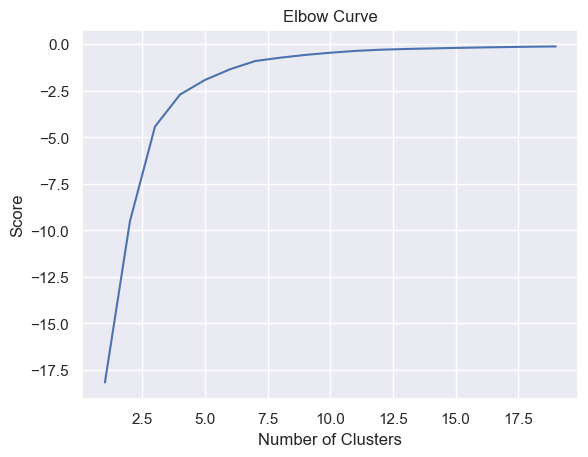

In [15]:
#selecting optimal k value from elbow curve
K_clusters = range(1,20)
kmeans = [KMeans(n_clusters=i) for i in K_clusters]
Y_axis = X[['latitude']]
X_axis = X[['longitude']]
score = [kmeans[i].fit(Y_axis).score(Y_axis) for i in range(len(kmeans))]
# Visualize
plt.plot(K_clusters, score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()

In [20]:
kmeans = KMeans(n_clusters = 8, init ='k-means++')
kmeans.fit(X[X.columns[1:3]]) # Compute k-means clustering.
X['location_cluster'] = kmeans.fit_predict(X[X.columns[1:3]])
centers = kmeans.cluster_centers_ # Coordinates of cluster centers.
labels = kmeans.predict(X[X.columns[1:3]]) # Labels of each point
X.head()

,id,latitude,longitude,location_cluster
0,44077,53.29178,-6.25792,7
1,85156,53.29209,-6.25624,7
2,159889,53.39027,-6.23547,1
3,162809,53.28326,-6.19188,7
4,165828,53.33744,-6.32363,5


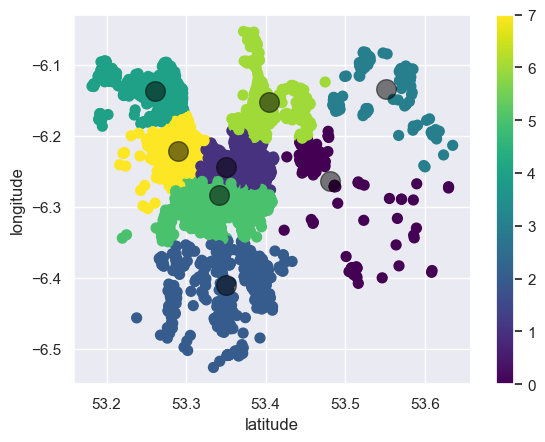

In [21]:
X.plot.scatter(x = 'latitude', y = 'longitude', c=labels, s=50, cmap='viridis')
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5)

In [ ]:
X = X.drop(['latitude','longitude'], axis=1)
listing_df = listing_df.merge(X, left_on='id', right_on='id')
# listing_df.info()

In [23]:
listing_df = listing_df.drop(['latitude','longitude', 'host_neighbourhood'], axis=1)

In [24]:
#mapping bathroom_text column
X=listing_df.loc[:,['id','bathrooms_text']]

In [25]:
bathrooms_text_map = {'0 shared baths':1,
                      '0 baths': 1,
                      'Shared half-bath': 2,
                      'Half-bath':3,
                      'Private half-bath':4,
                      '1 shared bath':5,
                      '1 bath': 6,
                      '1 private bath': 7,
                      '1.5 baths': 9,
                      '1.5 shared baths': 8,
                      '2 shared baths':10,
                      '2 baths':11,
                      '2.5 shared baths': 12,
                      '2.5 baths': 13,
                      '3 shared baths': 14,
                      '3 baths': 15,
                      '3.5 shared baths': 16,
                      '3.5 baths': 17,
                      '4 shared baths': 18,
                      '4 baths': 19,
                      '4.5 baths': 20,
                      '5 baths': 21,
                      '5.5 baths': 22,
                      '6 shared baths': 23,
                      '6 baths': 24,
                      '6.5 baths': 25,
                      '7 baths': 26,
                      '7.5 baths': 27,
                      '8 baths': 28,
                      '8.5 baths': 29,
                      '9.5 baths': 30}

X['bathroom_map'] = X.bathrooms_text.map(bathrooms_text_map)
X.head()

,id,bathrooms_text,bathroom_map
0,44077,1.5 shared baths,8.0
1,85156,1.5 shared baths,8.0
2,159889,2 shared baths,10.0
3,162809,1.5 shared baths,8.0
4,165828,1 bath,6.0


In [26]:
listing_df = listing_df.drop(['bathrooms_text'], axis=1).merge(X, left_on='id', right_on='id')

In [32]:
listing_df['bathrooms_text'].isnull().sum()

4

In [27]:
#filling the missing bathrooms_text most common type
listing_df['bathroom_map'] = listing_df['bathroom_map'].fillna(6)

In [33]:
listing_df = listing_df.drop(['bathrooms_text'], axis=1)

In [39]:
#calculating number of amenities for each listing
X=listing_df.loc[:,['id','amenities']]
X['amenities'] = X['amenities'].apply(lambda content: punctuation_processing(content=content))
X.head()

,id,amenities
0,44077,"Oven, Hot water kettle, Fire extinguisher, Out..."
1,85156,"Oven, Fire extinguisher, Dryer, Hangers, Indoo..."
2,159889,"Oven, Fire extinguisher, Hangers, Carbon monox..."
3,162809,"Oven, Hot water kettle, Fire extinguisher, Dry..."
4,165828,"Fire extinguisher, Dryer, Hangers, Indoor fire..."


In [40]:
def replace_Number(content):
   return len(content.split(','))
X['amenities_count'] = X['amenities'].apply(lambda content: replace_Number(content=content))
X.head()

,id,amenities,amenities_count
0,44077,"Oven, Hot water kettle, Fire extinguisher, Out...",50
1,85156,"Oven, Fire extinguisher, Dryer, Hangers, Indoo...",35
2,159889,"Oven, Fire extinguisher, Hangers, Carbon monox...",27
3,162809,"Oven, Hot water kettle, Fire extinguisher, Dry...",48
4,165828,"Fire extinguisher, Dryer, Hangers, Indoor fire...",26


In [41]:
X = X.drop(['amenities'], axis=1)

In [42]:
listing_df = listing_df.merge(X, left_on='id', right_on='id')

In [43]:
listing_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7566 entries, 0 to 7565
Data columns (total 44 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            7566 non-null   int64  
 1   description                                   7411 non-null   object 
 2   host_response_rate                            3932 non-null   object 
 3   host_is_superhost                             7566 non-null   object 
 4   host_listings_count                           7566 non-null   int64  
 5   host_total_listings_count                     7566 non-null   int64  
 6   host_verifications                            7566 non-null   object 
 7   host_has_profile_pic                          7566 non-null   object 
 8   host_identity_verified                        7566 non-null   object 
 9   property_type                                 7566 non-null   o

In [44]:
#mapping host verification by its count
X=listing_df.loc[:,['id','host_verifications']]
X['host_verifications'] = X['host_verifications'].apply(lambda content: punctuation_processing(content=content))
X['host_verifications_count'] = X['host_verifications'].apply(lambda content: replace_Number(content=content))
X = X.drop(['host_verifications'], axis=1)
X.head()

,id,host_verifications_count
0,44077,2
1,85156,2
2,159889,2
3,162809,2
4,165828,2


In [45]:
listing_df = listing_df.merge(X, left_on='id', right_on='id')
listing_df = listing_df.drop(['host_verifications'],axis=1)

In [46]:
#imputing the null values
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.linear_model import LinearRegression


X = listing_df.loc[:,['bedrooms','beds','host_response_rate','review_scores_rating','review_scores_accuracy','review_scores_cleanliness',
'review_scores_checkin','review_scores_communication','review_scores_location','review_scores_value','reviews_per_month']]

In [47]:
X['host_response_rate'] = X['host_response_rate'].str.replace('%', '')
X['host_response_rate'] = X['host_response_rate'].astype(float)

In [48]:
#model 1 - linear regression
estimator_model = LinearRegression()
imputer = IterativeImputer(estimator=estimator_model, missing_values=np.nan, max_iter=100, verbose=1, imputation_order='roman',random_state=0)
linearimputed = imputer.fit_transform(X)
linearimputed = pd.DataFrame(linearimputed)

[IterativeImputer] Completing matrix with shape (7566, 11)
[IterativeImputer] Change: 22.170216921635244, scaled tolerance: 0.1 
[IterativeImputer] Change: 50.30179707836028, scaled tolerance: 0.1 
[IterativeImputer] Change: 26.311950147800005, scaled tolerance: 0.1 
[IterativeImputer] Change: 6.909035622160047, scaled tolerance: 0.1 
[IterativeImputer] Change: 4.064876686812852, scaled tolerance: 0.1 
[IterativeImputer] Change: 4.750434901965406, scaled tolerance: 0.1 
[IterativeImputer] Change: 4.164663240299063, scaled tolerance: 0.1 
[IterativeImputer] Change: 3.38790526300798, scaled tolerance: 0.1 
[IterativeImputer] Change: 2.733514860745828, scaled tolerance: 0.1 
[IterativeImputer] Change: 2.246045273879332, scaled tolerance: 0.1 
[IterativeImputer] Change: 1.8975957561615076, scaled tolerance: 0.1 
[IterativeImputer] Change: 1.6485360749640279, scaled tolerance: 0.1 
[IterativeImputer] Change: 1.4652787994778294, scaled tolerance: 0.1 
[IterativeImputer] Change: 1.32381105074

In [49]:
#model 2 - kNN
from sklearn.impute import KNNImputer
knn = KNNImputer(n_neighbors=3)
knnimputed = knn.fit_transform(X)
knnimputed = pd.DataFrame(knnimputed)

In [50]:
i=0
for a in X:
  original_mean = round(X[a].mean(),2)
  linearimputed_mean = round(linearimputed[i].mean(),2)
  knnimputed_mean = round(knnimputed[i].mean(),2)
  i=i+1
  print(original_mean,linearimputed_mean,knnimputed_mean)

1.52 1.52 1.51
1.83 1.83 1.83
94.38 92.58 84.64
4.6 4.6 4.63
4.78 4.71 4.74
4.65 4.55 4.61
4.83 4.78 4.79
4.84 4.79 4.81
4.73 4.69 4.7
4.61 4.54 4.58
1.32 1.31 1.38


In [52]:
i = 0
for a in X:
  X[a] = linearimputed[i]
  i=i+1

In [53]:
for a in X:
    listing_df[a] = X[a]

In [54]:
listing_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7566 entries, 0 to 7565
Data columns (total 44 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            7566 non-null   int64  
 1   description                                   7411 non-null   object 
 2   host_response_rate                            7566 non-null   float64
 3   host_is_superhost                             7566 non-null   object 
 4   host_listings_count                           7566 non-null   int64  
 5   host_total_listings_count                     7566 non-null   int64  
 6   host_has_profile_pic                          7566 non-null   object 
 7   host_identity_verified                        7566 non-null   object 
 8   property_type                                 7566 non-null   object 
 9   room_type                                     7566 non-null   o

In [55]:
#mapping binary categorical data with 0 and 1
listing_df['host_is_superhost'] = listing_df['host_is_superhost'].map({'t': 1, 'f': 0})
listing_df['host_has_profile_pic'] = listing_df['host_has_profile_pic'].map({'t': 1, 'f': 0})
listing_df['host_identity_verified'] = listing_df['host_identity_verified'].map({'t': 1, 'f': 0})
listing_df['has_availability'] = listing_df['has_availability'].map({'t': 1, 'f': 0})
listing_df['instant_bookable'] = listing_df['instant_bookable'].map({'t': 1, 'f': 0})
listing_df['room_type'] = listing_df['room_type'].map({'Shared room': 1, 'Hotel room': 2, 'Private room': 3, 'Entire home/apt': 4})
listing_df['price'] = listing_df['price'].str.replace('$', '')
listing_df['price'] = listing_df['price'].str.replace(',', '')
listing_df['price'] = listing_df['price'].astype(float)
listing_df = listing_df.drop(['property_type'], axis=1)

C:\Users\sarathkumar\AppData\local\Temp\ipykernel_9152\4166323578.py:8: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  listing_df['price'] = listing_df['price'].str.replace('$', '')


In [56]:
listing_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7566 entries, 0 to 7565
Data columns (total 43 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            7566 non-null   int64  
 1   description                                   7411 non-null   object 
 2   host_response_rate                            7566 non-null   float64
 3   host_is_superhost                             7566 non-null   int64  
 4   host_listings_count                           7566 non-null   int64  
 5   host_total_listings_count                     7566 non-null   int64  
 6   host_has_profile_pic                          7566 non-null   int64  
 7   host_identity_verified                        7566 non-null   int64  
 8   room_type                                     7566 non-null   int64  
 9   accommodates                                  7566 non-null   i

In [58]:
listing_df = listing_df.drop(['amenities', 'first_review', 'last_review'], axis=1)

In [59]:
listing_df = listing_df.drop(['description'], axis=1)

In [61]:
listing_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7566 entries, 0 to 7565
Data columns (total 39 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            7566 non-null   int64  
 1   host_response_rate                            7566 non-null   float64
 2   host_is_superhost                             7566 non-null   int64  
 3   host_listings_count                           7566 non-null   int64  
 4   host_total_listings_count                     7566 non-null   int64  
 5   host_has_profile_pic                          7566 non-null   int64  
 6   host_identity_verified                        7566 non-null   int64  
 7   room_type                                     7566 non-null   int64  
 8   accommodates                                  7566 non-null   int64  
 9   bedrooms                                      7566 non-null   f

In [60]:
listing_df.to_csv('download\\revisedListing.csv', index=False)

In [67]:
final_df = pd.merge(listing_df,final_reviews,left_on='id',right_on='id',how='left')

In [68]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7566 entries, 0 to 7565
Data columns (total 41 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            7566 non-null   int64  
 1   host_response_rate                            7566 non-null   float64
 2   host_is_superhost                             7566 non-null   int64  
 3   host_listings_count                           7566 non-null   int64  
 4   host_total_listings_count                     7566 non-null   int64  
 5   host_has_profile_pic                          7566 non-null   int64  
 6   host_identity_verified                        7566 non-null   int64  
 7   room_type                                     7566 non-null   int64  
 8   accommodates                                  7566 non-null   int64  
 9   bedrooms                                      7566 non-null   f

In [70]:
#dropping reviews column
final_df = final_df.drop(['comments'], axis=1)

In [71]:
X = final_df.loc[:,['sentiment']]

In [72]:
#model 1 - linear regression
estimator_model = LinearRegression()
imputer = IterativeImputer(estimator=estimator_model, missing_values=np.nan, max_iter=100, verbose=1, imputation_order='roman',random_state=0)
linearimputed = imputer.fit_transform(X)
linearimputed = pd.DataFrame(linearimputed)

In [73]:
#model 2 - kNN
from sklearn.impute import KNNImputer
knn = KNNImputer(n_neighbors=3)
knnimputed = knn.fit_transform(X)
knnimputed = pd.DataFrame(knnimputed)

In [74]:
i=0
for a in X:
  original_mean = round(X[a].mean(),2)
  linearimputed_mean = round(linearimputed[i].mean(),2)
  knnimputed_mean = round(knnimputed[i].mean(),2)
  i=i+1
  print(original_mean,linearimputed_mean,knnimputed_mean)

0.79 0.79 0.79


In [75]:
i = 0
for a in X:
  X[a] = linearimputed[i]
  i=i+1
for a in X:
    final_df[a] = X[a]

In [76]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7566 entries, 0 to 7565
Data columns (total 40 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            7566 non-null   int64  
 1   host_response_rate                            7566 non-null   float64
 2   host_is_superhost                             7566 non-null   int64  
 3   host_listings_count                           7566 non-null   int64  
 4   host_total_listings_count                     7566 non-null   int64  
 5   host_has_profile_pic                          7566 non-null   int64  
 6   host_identity_verified                        7566 non-null   int64  
 7   room_type                                     7566 non-null   int64  
 8   accommodates                                  7566 non-null   int64  
 9   bedrooms                                      7566 non-null   f

In [77]:
# final_df.to_csv('download\\FinalDataset.csv', index=False)